In [ ]:
import os
from google.colab import drive
drive.mount("/content/drive")
os.chdir("/content/drive/MyDrive/Deep Learning/")

Mounted at /content/drive


## Import Packages

In [ ]:
!pip install -q "monai[tqdm, nibabel, qdown, ignite]" "itk" "itkwidgets"

     |████████████████████████████████| 721 kB 11.7 MB/s 
     |████████████████████████████████| 3.4 MB 62.5 MB/s 
     |████████████████████████████████| 70.6 MB 9.0 kB/s 
     |████████████████████████████████| 20.3 MB 1.2 MB/s 
     |████████████████████████████████| 16.6 MB 65.0 MB/s 
     |████████████████████████████████| 15.0 MB 60.7 MB/s 
     |████████████████████████████████| 95.3 MB 1.3 MB/s 
     |████████████████████████████████| 54.5 MB 27 kB/s 
     |████████████████████████████████| 508 kB 69.1 MB/s 
     |████████████████████████████████| 862 kB 62.0 MB/s 
     |████████████████████████████████| 271 kB 76.8 MB/s 
     |████████████████████████████████| 2.5 MB 68.9 MB/s 
     |████████████████████████████████| 11.2 MB 45.1 MB/s 
     |████████████████████████████████| 930 kB 66.7 MB/s 
     |████████████████████████████████| 251 kB 72.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the

In [ ]:
import logging
import os
import sys
import tempfile
from glob import glob
import time
import numpy as np
import matplotlib.pyplot as plt
import cv2

import torch
from PIL import Image
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

import monai
from monai.data import create_test_image_2d, list_data_collate, decollate_batch
from monai.inferers import sliding_window_inference, SimpleInferer
from monai.metrics import DiceMetric
from monai.transforms import (
    Activations,
    AddChanneld,
    AsDiscrete,
    Compose,
    LoadImaged,
    RandCropByPosNegLabeld,
    RandRotate90d,
    ScaleIntensityd,
    EnsureTyped,
    EnsureType,
    AsChannelFirstd,
    AsChannelLast,
    Resized,
    RandScaleCropd,
    RandRotated,
    SaveImage,
)
from monai.visualize import plot_2d_or_3d_image

## Check Monai Configuration

In [ ]:
monai.config.print_config()
logging.basicConfig(stream=sys.stdout, level=logging.INFO)

MONAI version: 0.8.1
Numpy version: 1.21.6
Pytorch version: 1.11.0+cu113
MONAI flags: HAS_EXT = False, USE_COMPILED = False
MONAI rev id: 71ff399a3ea07aef667b23653620a290364095b1

Optional dependencies:
Pytorch Ignite version: 0.4.8
Nibabel version: 3.0.2
scikit-image version: 0.18.3
Pillow version: 7.1.2
Tensorboard version: 2.8.0
gdown version: 4.4.0
TorchVision version: 0.12.0+cu113
tqdm version: 4.64.0
lmdb version: 0.99
psutil version: 5.4.8
pandas version: 1.3.5
einops version: NOT INSTALLED or UNKNOWN VERSION.
transformers version: NOT INSTALLED or UNKNOWN VERSION.
mlflow version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



## Process VGH data

In [ ]:
data_path = "/content/drive/MyDrive/Deep Learning/SEG_Train_Datasets/dataset/"

-obtain train datalist

In [ ]:
tempdir = data_path + "train/image/"
train_images = sorted(glob(os.path.join(tempdir, "*.jpg")))

tempdir = data_path + "train/msk_img/"
train_segs = sorted(glob(os.path.join(tempdir, "*.png")))
print(f" {len(train_images)} train_images and {len(train_segs)} train_segs")
train_files = [{"img": img, "seg": seg} for img, seg in zip(train_images[:], train_segs[:])]

 842 train_images and 842 train_segs


-obtain validation datalist

In [ ]:
tempdir = data_path + "validation/image/"
valid_images = sorted(glob(os.path.join(tempdir, "*.jpg")))

tempdir = data_path + "validation/msk_img/"
valid_segs = sorted(glob(os.path.join(tempdir, "*.png")))
print(f" {len(valid_images)} valid_images and {len(valid_segs)} valid_segs")

val_files = [{"img": img, "seg": seg} for img, seg in zip(valid_images[:], valid_segs[:])]

 105 valid_images and 105 valid_segs


## Define Transform for image and Segmentation

In [ ]:
# define transforms for image and segmentation
train_transforms = Compose(
    [
        LoadImaged(keys=["img", "seg"]),
        AddChanneld(keys=["seg"]),
        AsChannelFirstd(keys=["img"]),
        ScaleIntensityd(keys=["img", "seg"]),
        RandScaleCropd(keys=["img", "seg"],roi_scale=0.5),
        RandRotated(keys=["img", "seg"],range_x=3.14),
        Resized(keys=["img", "seg"], spatial_size=[800, 800]),
        #RandCropByPosNegLabeld(
        #    keys=["img", "seg"], label_key="seg", spatial_size=[96, 96], pos=1, neg=1, num_samples=4
        #),
        RandRotate90d(keys=["img", "seg"], prob=0.5, spatial_axes=[0, 1]),
        EnsureTyped(keys=["img", "seg"]),
    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["img", "seg"]),
        AddChanneld(keys=["seg"]),
        AsChannelFirstd(keys=["img"]),
        ScaleIntensityd(keys=["img", "seg"]),
        Resized(keys=["img", "seg"], spatial_size=[800, 800]),
        EnsureTyped(keys=["img", "seg"]),
    ]
)

## Check and Visualize the Transform Result

In [ ]:
# define dataset, data loader
check_ds = monai.data.Dataset(data=train_files, transform=train_transforms)

This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


torch.Size([8, 3, 800, 800]) torch.Size([8, 1, 800, 800])


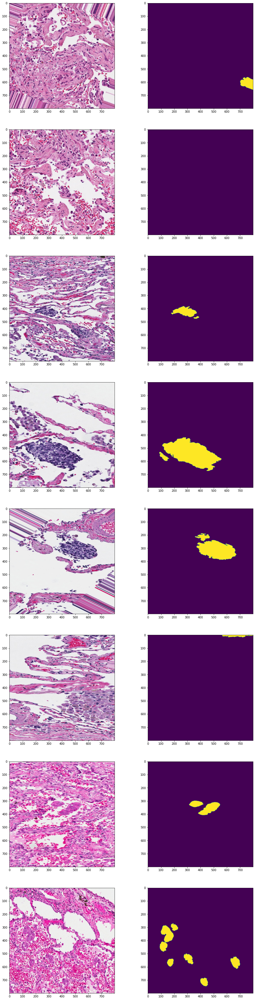

In [ ]:
# use batch_size=2 to load images and use RandCropByPosNegLabeld to generate 2 x 4 images for network training
check_loader = DataLoader(check_ds, batch_size=8, num_workers=12, collate_fn=list_data_collate)
check_data = monai.utils.misc.first(check_loader)
print(check_data["img"].shape, check_data["seg"].shape)


import matplotlib.pyplot as plt

plt.figure("visualize",(16,64))
for i in range(8):
    plt.subplot(8,2,2*i+1)
    plt.imshow(check_data["img"][i].permute(1,2,0))
    plt.subplot(8,2,2*i+2)
    plt.imshow(check_data["seg"][i].permute(1,2,0).squeeze())

## Create DataLoader for train and validation data

In [ ]:
# create a training data loader
train_ds = monai.data.Dataset(data=train_files, transform=train_transforms)
# use batch_size=2 to load images and use RandCropByPosNegLabeld to generate 2 x 4 images for network training
train_loader = DataLoader(
    train_ds,
    batch_size=8,
    shuffle=True,
    num_workers=8,
    collate_fn=list_data_collate,
    pin_memory=torch.cuda.is_available(),
)

# create a validation data loader
val_ds = monai.data.Dataset(data=val_files, transform=val_transforms)
val_loader = DataLoader(val_ds, batch_size=4, num_workers=4, collate_fn=list_data_collate)

This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


## Define Metric and Post-Processing

In [ ]:
dice_metric = DiceMetric(include_background=False, reduction="mean", get_not_nans=False)
post_trans = Compose([EnsureType(), Activations(sigmoid=True), AsDiscrete(threshold=0.5)])

## Bulit Model

In [ ]:
# create UNet, DiceLoss and Adam optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = monai.networks.nets.UNet(
    spatial_dims=2,
    in_channels=3,
    out_channels=1,
    #channels=(16, 32, 64, 128, 256),
    channels=(32, 64, 128, 256, 512),
    strides=(2, 2, 2, 2),
    num_res_units=2,
).to(device)


loss_function = monai.losses.DiceLoss(sigmoid=True)
optimizer = torch.optim.Adam(model.parameters(), 1e-3)

## Create Visualize Function

In [ ]:
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 16))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

## Define Training Parameters and Start Training

----------
epoch 1/20


This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


2022-05-23 08:35:06 epoch 1 average loss: 0.9139


This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


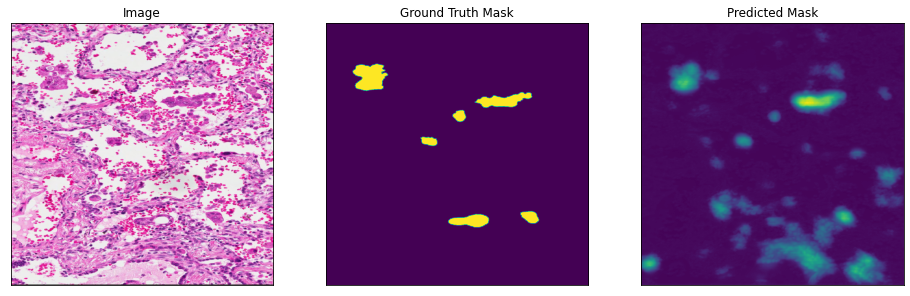

saved new best metric model
current epoch: 1 current val mean dice loss: 0.3170 best val mean dice loss: 0.3170 at epoch 1
----------
epoch 2/20
2022-05-23 08:37:20 epoch 2 average loss: 0.8997


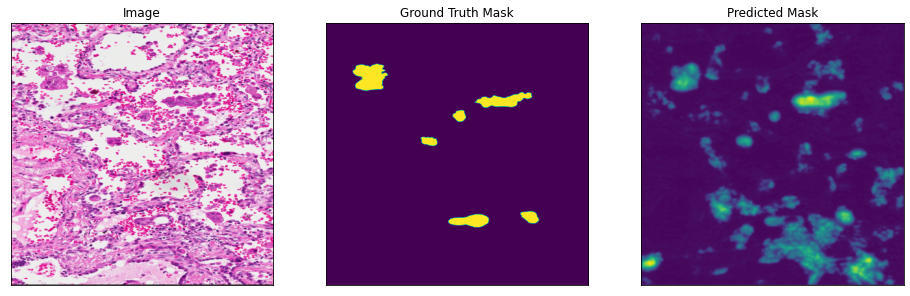

current epoch: 2 current val mean dice loss: 0.3552 best val mean dice loss: 0.3170 at epoch 1
----------
epoch 3/20
2022-05-23 08:39:17 epoch 3 average loss: 0.8763


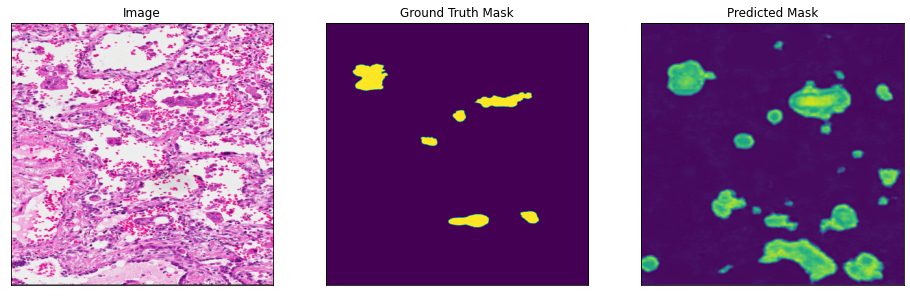

saved new best metric model
current epoch: 3 current val mean dice loss: 0.2698 best val mean dice loss: 0.2698 at epoch 3
----------
epoch 4/20
2022-05-23 08:41:14 epoch 4 average loss: 0.8381


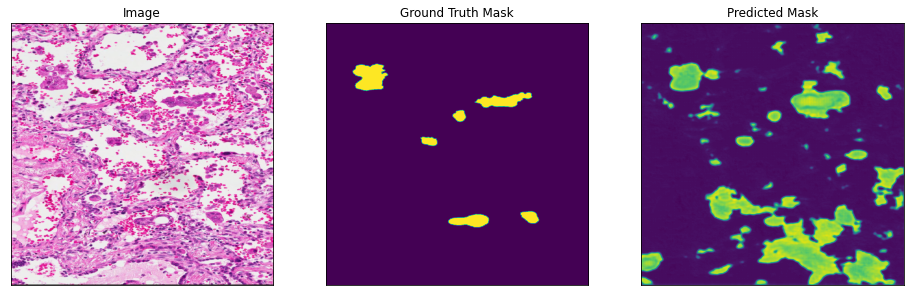

current epoch: 4 current val mean dice loss: 0.3279 best val mean dice loss: 0.2698 at epoch 3
----------
epoch 5/20
2022-05-23 08:43:10 epoch 5 average loss: 0.8000


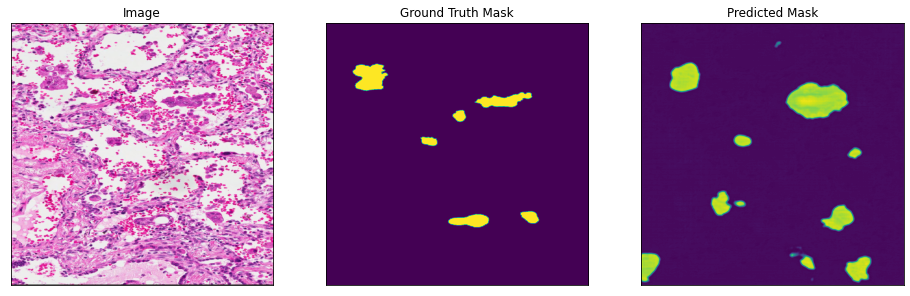

saved new best metric model
current epoch: 5 current val mean dice loss: 0.1479 best val mean dice loss: 0.1479 at epoch 5
----------
epoch 6/20
2022-05-23 08:45:09 epoch 6 average loss: 0.7616


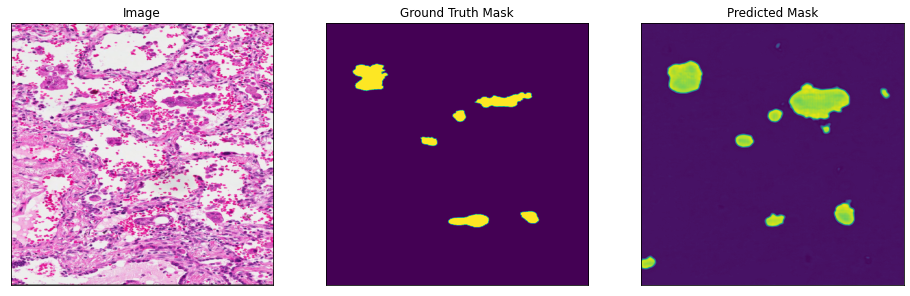

current epoch: 6 current val mean dice loss: 0.1504 best val mean dice loss: 0.1479 at epoch 5
----------
epoch 7/20
2022-05-23 08:47:06 epoch 7 average loss: 0.7136


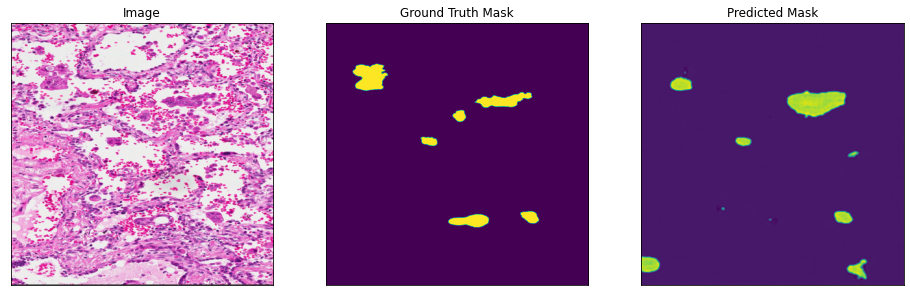

saved new best metric model
current epoch: 7 current val mean dice loss: 0.0868 best val mean dice loss: 0.0868 at epoch 7
----------
epoch 8/20
2022-05-23 08:49:04 epoch 8 average loss: 0.6841


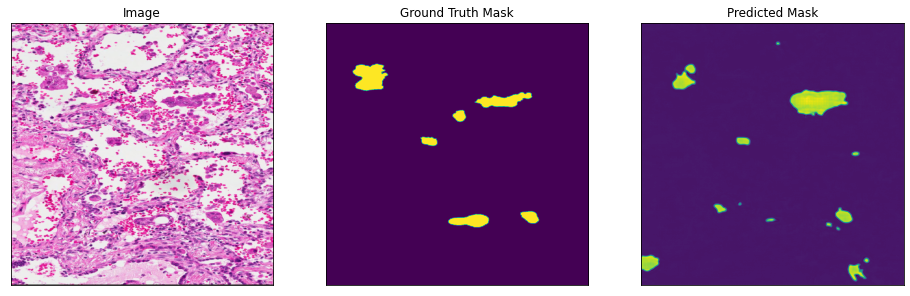

current epoch: 8 current val mean dice loss: 0.0895 best val mean dice loss: 0.0868 at epoch 7
----------
epoch 9/20
2022-05-23 08:51:01 epoch 9 average loss: 0.6392


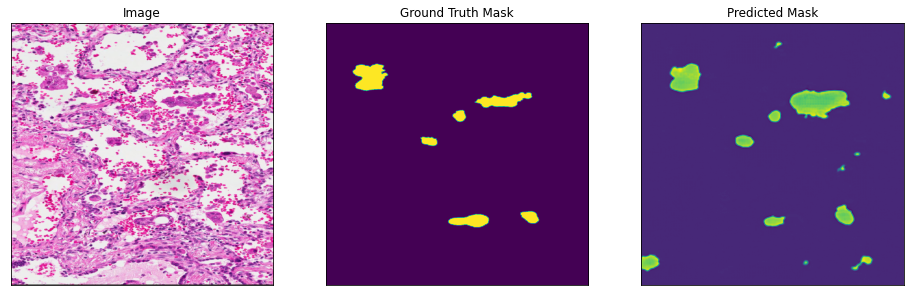

current epoch: 9 current val mean dice loss: 0.1032 best val mean dice loss: 0.0868 at epoch 7
----------
epoch 10/20
2022-05-23 08:52:58 epoch 10 average loss: 0.6002


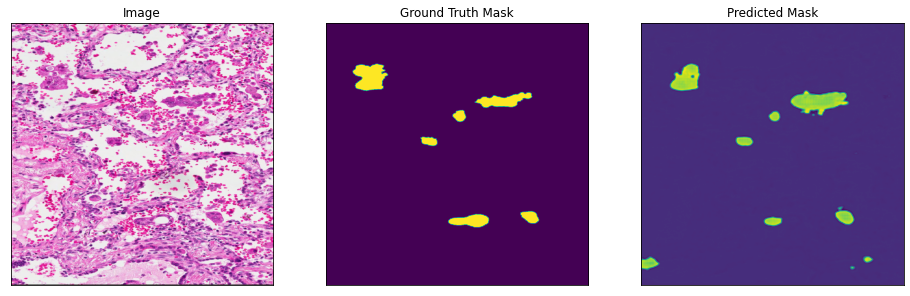

saved new best metric model
current epoch: 10 current val mean dice loss: 0.0753 best val mean dice loss: 0.0753 at epoch 10
----------
epoch 11/20
2022-05-23 08:54:54 epoch 11 average loss: 0.5605


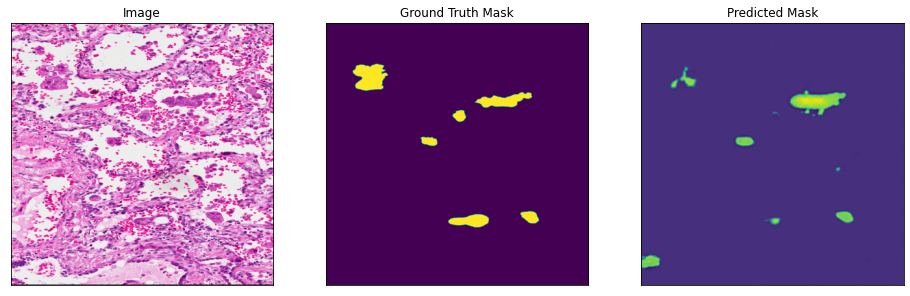

saved new best metric model
current epoch: 11 current val mean dice loss: 0.0606 best val mean dice loss: 0.0606 at epoch 11
----------
epoch 12/20
2022-05-23 08:56:52 epoch 12 average loss: 0.4951


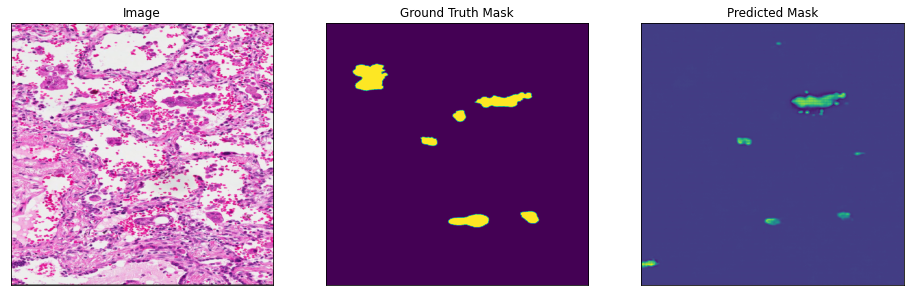

saved new best metric model
current epoch: 12 current val mean dice loss: 0.0390 best val mean dice loss: 0.0390 at epoch 12
----------
epoch 13/20
2022-05-23 08:58:49 epoch 13 average loss: 0.4319


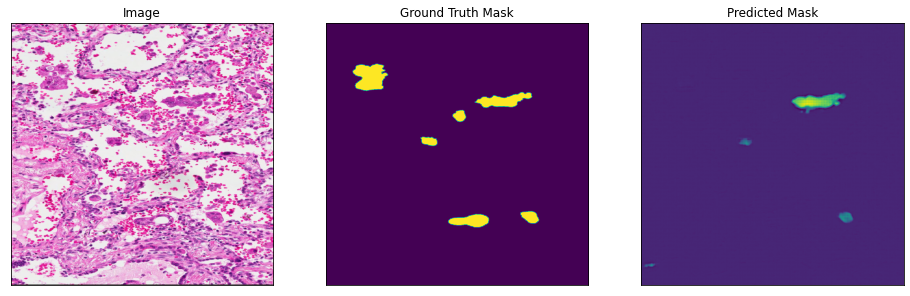

saved new best metric model
current epoch: 13 current val mean dice loss: 0.0290 best val mean dice loss: 0.0290 at epoch 13
----------
epoch 14/20
2022-05-23 09:00:45 epoch 14 average loss: 0.3997


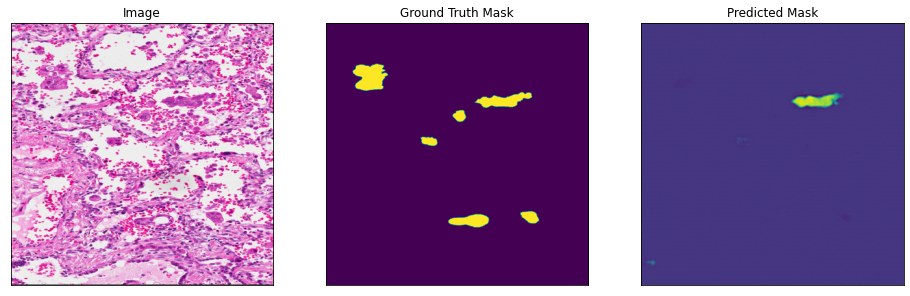

saved new best metric model
current epoch: 14 current val mean dice loss: 0.0241 best val mean dice loss: 0.0241 at epoch 14
----------
epoch 15/20
2022-05-23 09:02:41 epoch 15 average loss: 0.3867


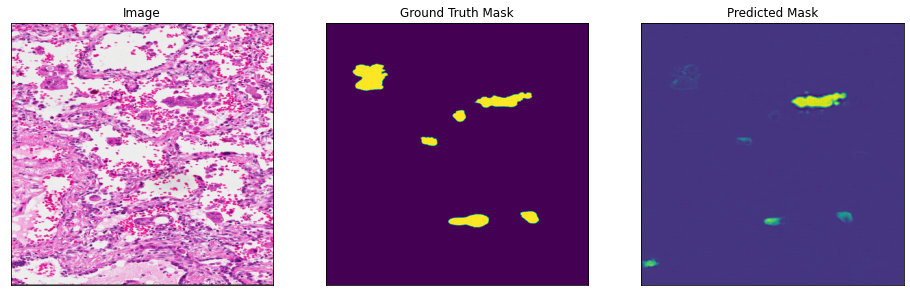

current epoch: 15 current val mean dice loss: 0.0457 best val mean dice loss: 0.0241 at epoch 14
----------
epoch 16/20
2022-05-23 09:04:37 epoch 16 average loss: 0.3822


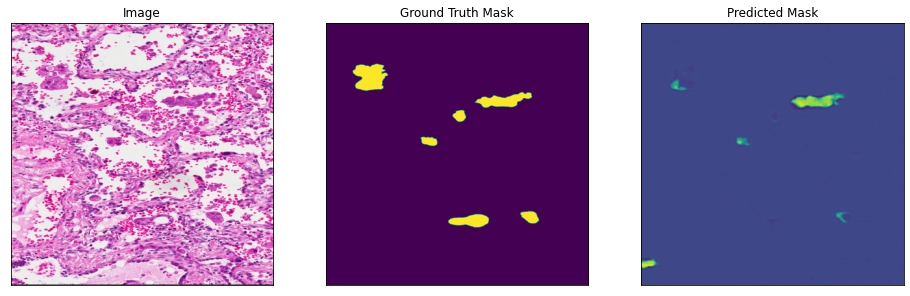

current epoch: 16 current val mean dice loss: 0.0431 best val mean dice loss: 0.0241 at epoch 14
----------
epoch 17/20
2022-05-23 09:06:36 epoch 17 average loss: 0.3522


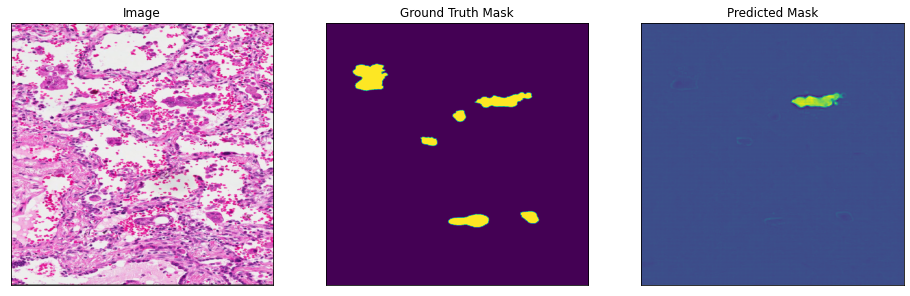

current epoch: 17 current val mean dice loss: 0.0322 best val mean dice loss: 0.0241 at epoch 14
----------
epoch 18/20
2022-05-23 09:08:39 epoch 18 average loss: 0.3716


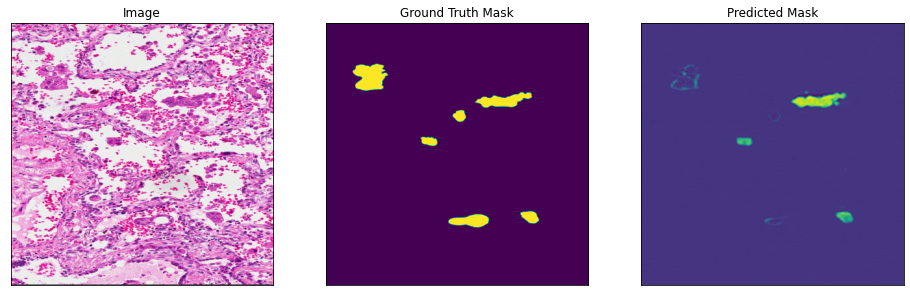

current epoch: 18 current val mean dice loss: 0.0384 best val mean dice loss: 0.0241 at epoch 14
----------
epoch 19/20
2022-05-23 09:10:42 epoch 19 average loss: 0.3498


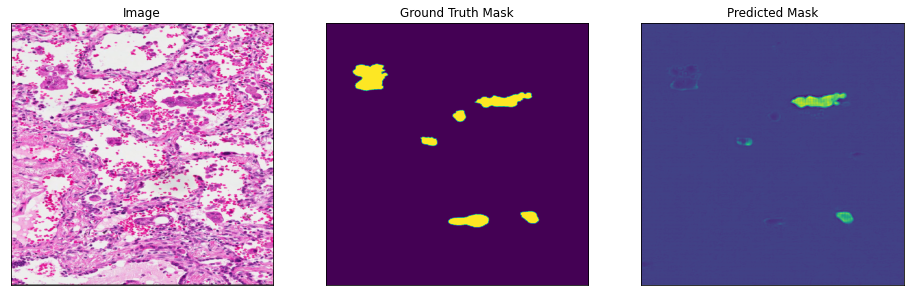

current epoch: 19 current val mean dice loss: 0.0432 best val mean dice loss: 0.0241 at epoch 14
----------
epoch 20/20
2022-05-23 09:12:41 epoch 20 average loss: 0.3566


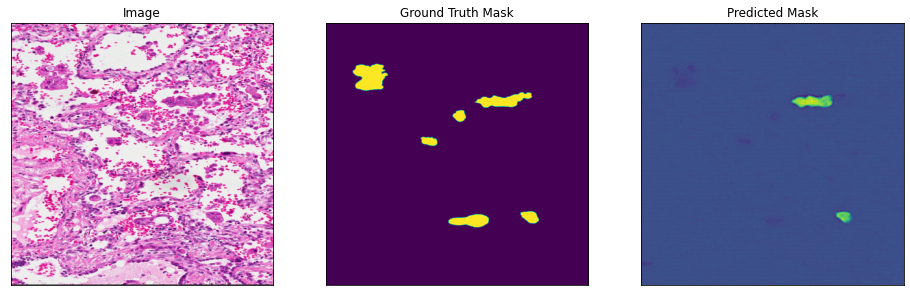

current epoch: 20 current val mean dice loss: 0.0269 best val mean dice loss: 0.0241 at epoch 14
train completed, best_metric: 0.0241 at epoch: 14


In [ ]:
#### start a typical PyTorch training
total_epochs = 20
val_interval = 1
best_metric = 100
best_metric_epoch = -1
epoch_loss_values = list()
metric_values = list()
writer = SummaryWriter()
for epoch in range(total_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{total_epochs}")
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = batch_data["img"].to(device), batch_data["seg"].to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = loss_function(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_len = len(train_ds) // train_loader.batch_size
        # print(f"{step}/{epoch_len}, train_loss: {loss.item():.4f}")
        writer.add_scalar("train_loss", loss.item(), epoch_len * epoch + step)
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    local_time = time.strftime("%Y-%m-%d %H:%M:%S", time.localtime())
    print(f"{local_time} epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    if (epoch + 1) % val_interval == 0:
        model.eval()
        with torch.no_grad():
            val_images = None
            val_labels = None
            val_outputs = None
            show_val = True
            for val_data in val_loader:
                val_images, val_labels = val_data["img"].to(device), val_data["seg"].to(device)
                roi_size = (800, 800)
                sw_batch_size = 4
                val_outputs = sliding_window_inference(val_images, roi_size, sw_batch_size, model)

                if show_val:
                    visualize(
                        image=val_images[0].cpu().permute(1,2,0),
                        ground_truth_mask=val_labels[0].cpu().permute(1,2,0).squeeze(),
                        predicted_mask=val_outputs[0].cpu().permute(1,2,0).squeeze()
                    )
                show_val = False

                val_outputs = [post_trans(i) for i in decollate_batch(val_outputs)]
                val_labels = [post_trans(i) for i in decollate_batch(val_labels)]
                # compute metric for current iteration
                dice_metric(y_pred=val_outputs, y=val_labels)
            # aggregate the final mean dice result
            metric = dice_metric.aggregate().item()
            # reset the status for next validation round
            dice_metric.reset()
            metric_values.append(metric)
            if metric < best_metric:
                best_metric = metric
                best_metric_epoch = epoch + 1
                torch.save(model.state_dict(), "best_metric_model_segmentation2d_dict.pth")
                print("saved new best metric model")
            print(
                "current epoch: {} current val mean dice loss: {:.4f} best val mean dice loss: {:.4f} at epoch {}".format(
                    epoch + 1, metric, best_metric, best_metric_epoch
                )
            )
            writer.add_scalar("val_mean_dice loss", metric, epoch + 1)
            # plot the last model output as GIF image in TensorBoard with the corresponding image and label
            plot_2d_or_3d_image(val_images, epoch + 1, writer, index=0, tag="image")
            plot_2d_or_3d_image(val_labels, epoch + 1, writer, index=0, tag="label")
            plot_2d_or_3d_image(val_outputs, epoch + 1, writer, index=0, tag="output")


print(f"train completed, best_metric: {best_metric:.4f} at epoch: {best_metric_epoch}")
writer.close()


torch.save(model.state_dict(), "Final_model_40_epoches_segmentation2d_dict.pth")

-obtain testing datalist

In [ ]:
# Load testing files
tempdir = data_path + "test/image/"
test_images = sorted(glob(os.path.join(tempdir, "*.jpg")))

tempdir = data_path + "test/msk_img/"
test_segs = sorted(glob(os.path.join(tempdir, "*.png")))

print(f" {len(test_images)} test_images and {len(test_segs)} test_segs")

test_files = [{"img": img, "seg": seg} for img, seg in zip(test_images[:], test_segs[:])]

 106 test_images and 106 test_segs


## Define Transform for Image and Segmentation

In [ ]:
# define transforms for image and segmentation
test_transforms = Compose(
    [
        LoadImaged(keys=["img", "seg"]),

        AddChanneld(keys=["seg"]),
        AsChannelFirstd(keys=["img"]),

        ScaleIntensityd(keys=["img", "seg"]),
        #Resized(keys=["img", "seg"], spatial_size=[800, 800]),
        EnsureTyped(keys=["img", "seg"]),
    ]
)
test_ds = monai.data.Dataset(data=test_files, transform=test_transforms)

## Save IM(images) GT(ground-truths) PD(predictions) in the **output** folder

In [ ]:
test_loader = DataLoader(test_ds, batch_size=1, num_workers=4, collate_fn=list_data_collate)
saverPD = SaveImage(output_dir="./output", output_ext=".png", output_postfix="PD",scale=255,separate_folder=False)
saverGT = SaveImage(output_dir="./output", output_ext=".png", output_postfix="GT",scale=255,separate_folder=False)
saverIM = SaveImage(output_dir="./output", output_ext=".png", output_postfix="IM",scale=255,separate_folder=False)

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


In [ ]:
model.load_state_dict(torch.load("best_metric_model_segmentation2d_dict.pth"))

<All keys matched successfully>

## Inference on Test Data

In [ ]:
with torch.no_grad():
    for test_data in test_loader:
        test_images, test_labels = test_data["img"].to(device), test_data["seg"].to(device)
        # define sliding window size and batch size for windows inference
        roi_size = (800, 800)
        sw_batch_size = 4
        test_outputs = sliding_window_inference(test_images, roi_size, sw_batch_size, model)

        visualize(
            image=test_images[0].cpu().permute(1,2,0),
            ground_truth_mask=test_labels[0].cpu().permute(1,2,0).squeeze(),
            predicted_mask=test_outputs[0].squeeze().cpu().numpy().round()
        )
        saverGT(test_labels[0].cpu())
        saverIM(test_images[0].cpu())
        saverPD(test_outputs[0].cpu())

        test_outputs = [post_trans(i) for i in decollate_batch(test_outputs)]
        test_labels = [post_trans(i) for i in decollate_batch(test_labels)]



        # compute metric for current iteration
        dice_metric(y_pred=test_outputs, y=test_labels)
        #for test_output in test_outputs:
        #    saver(test_output*255)
    # aggregate the final mean dice result
    print("evaluation metric:", dice_metric.aggregate().item())
    # reset the status
    dice_metric.reset()

# Public Image Prediction

In [ ]:
pred_path =  "/content/drive/MyDrive/Deep Learning/Public_Image/"

In [ ]:
# Load testing files
tempdir = pred_path
pred_images = sorted(glob(os.path.join(tempdir, "*.jpg")))

tempdir = pred_path
pred_name = sorted(np.array([name.split(".")[0].split("_")[1] for name in next(os.walk(tempdir))[2]]))

print(f" {len(pred_images)} prediction_images")

pred_files = [{"img": img } for img in zip(pred_images[:])]

 131 prediction_images


In [ ]:
image_name = pred_name[0]
print(f" prediction1/{image_name}.png")

 prediction1/00000000.png


In [ ]:
# define transforms for image and segmentation
pred_transforms = Compose(
    [
        LoadImaged(keys=["img"]),
        # AddChanneld(keys=["lab"]),
        AsChannelFirstd(keys=["img"]),
        ScaleIntensityd(keys=["img"]),
        #Resized(keys=["img", "seg"], spatial_size=[800, 800]),
        EnsureTyped(keys=["img"]),
    ]
)
pred_ds = monai.data.Dataset(data=pred_files, transform=pred_transforms)

In [ ]:
pred_loader = DataLoader(pred_ds, batch_size=1, num_workers=4, collate_fn=list_data_collate)
saverPD = SaveImage(output_dir="./prediction", output_ext=".png", output_postfix="",scale=255,separate_folder=False)

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


In [ ]:
# create UNet, DiceLoss and Adam optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = monai.networks.nets.UNet(
    spatial_dims=2,
    in_channels=3,
    out_channels=1,
    #channels=(16, 32, 64, 128, 256),
    channels=(32, 64, 128, 256, 512),
    strides=(2, 2, 2, 2),
    num_res_units=2,
).to(device)


loss_function = monai.losses.DiceLoss(sigmoid=True)
optimizer = torch.optim.Adam(model.parameters(), 1e-3)

In [ ]:
model.load_state_dict(torch.load("best_metric_model_segmentation2d_dict.pth"))

<All keys matched successfully>

In [ ]:
with torch.no_grad():
    for pred_data in pred_loader:
        pred_images  = pred_data["img"].to(device)
        # define sliding window size and batch size for windows inference
        roi_size = (800, 800)
        sw_batch_size = 4
        pred_outputs = sliding_window_inference(pred_images, roi_size, sw_batch_size, model)

        # visualize(
        #     image=pred_images[0].cpu().permute(1,2,0),
        #     # ground_truth_mask=test_labels[0].cpu().permute(1,2,0).squeeze(),
        #     predicted_mask=pred_outputs[0].squeeze().cpu().numpy().round()
        # )
        saverPD(pred_outputs[0].cpu())


This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


file written: prediction/0.png.
file written: prediction/1.png.
file written: prediction/2.png.
file written: prediction/3.png.
file written: prediction/4.png.
file written: prediction/5.png.
file written: prediction/6.png.
file written: prediction/7.png.
file written: prediction/8.png.
file written: prediction/9.png.
file written: prediction/10.png.
file written: prediction/11.png.
file written: prediction/12.png.
file written: prediction/13.png.
file written: prediction/14.png.
file written: prediction/15.png.
file written: prediction/16.png.
file written: prediction/17.png.
file written: prediction/18.png.
file written: prediction/19.png.
file written: prediction/20.png.
file written: prediction/21.png.
file written: prediction/22.png.
file written: prediction/23.png.
file written: prediction/24.png.
file written: prediction/25.png.
file written: prediction/26.png.
file written: prediction/27.png.
file written: prediction/28.png.
file written: prediction/29.png.
file written: predic

In [ ]:
import glob
import shutil
prediction_path = glob.glob("/content/drive/MyDrive/Deep Learning/prediction/*")

In [ ]:
dest_path = "/content/drive/MyDrive/Deep Learning/prediction/named/"
os.makedirs(dest_path)
for path in prediction_path:
  image_name = os.path.basename(path)
  new_name = image_name.rjust(12, "0")
  new_name = "Public_" + new_name
  new_path = os.path.join(dest_path, new_name)
  shutil.copy(path , new_path)